<h1 style="text-align: center;">Deep Learning<br><br>Regression with ANN<br><br>KC House Data<br><h1>

# Keras Regression

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

/Users/kadiryildirim/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# folium 
# !pip install folium             
#!conda install folium -c conda-forge

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [5]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [6]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [8]:
df.isnull().sum().any()

False

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### Id_number

In [10]:
# drop the id number feature
df = df.drop('id', axis = 1)

### price

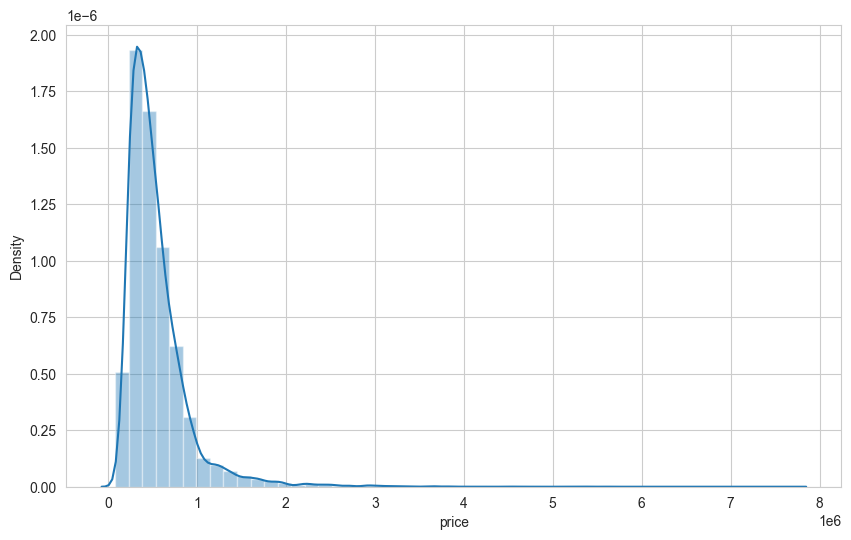

In [11]:
sns.distplot(df['price']);
# right skewed. extreme data points on the upper part

In [12]:
# check the houses with a price over 300k
df[df["price"] > 3000000].sort_values(by="price", ascending=False)
# valid data points

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


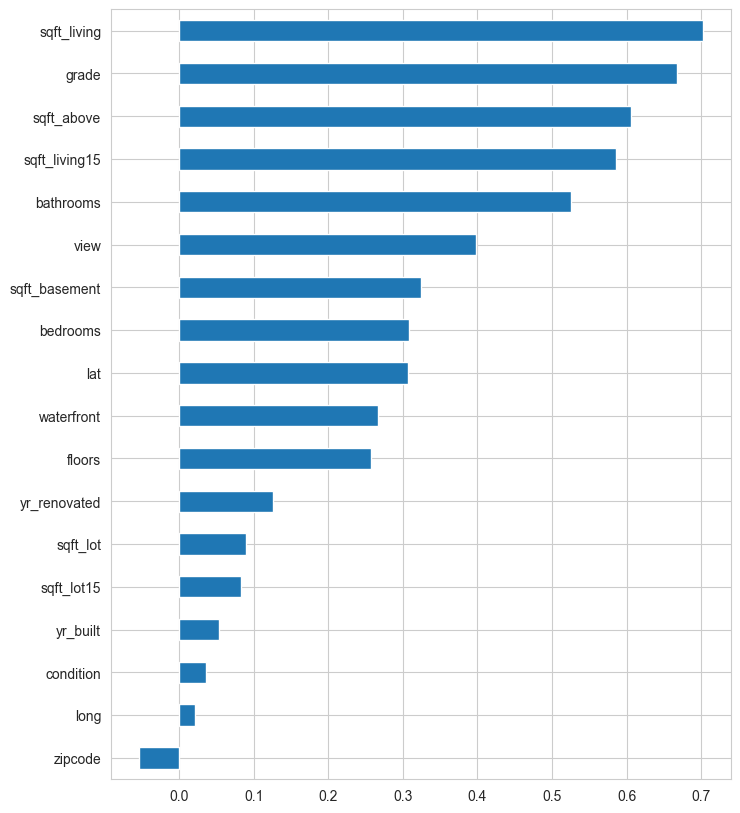

In [14]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");
# df.corr(numeric_only=True)["price"].sort_values().drop("price").plot(kind = "barh");

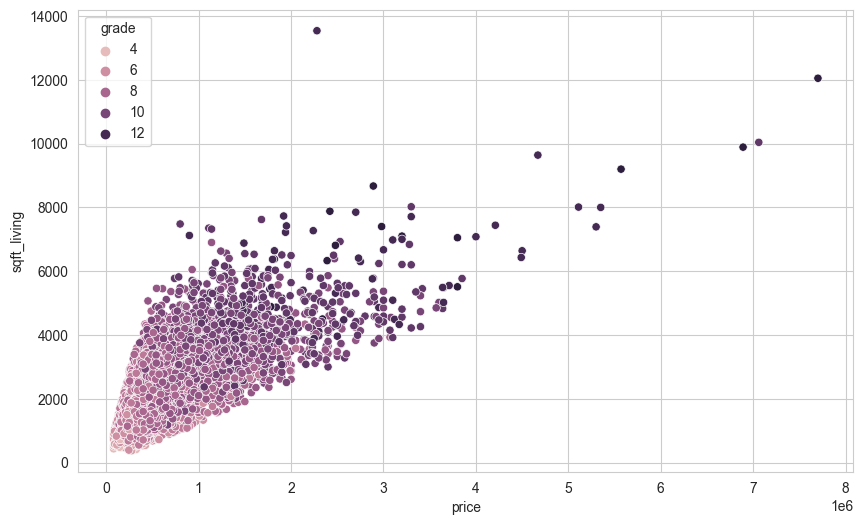

In [16]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

### bedrooms

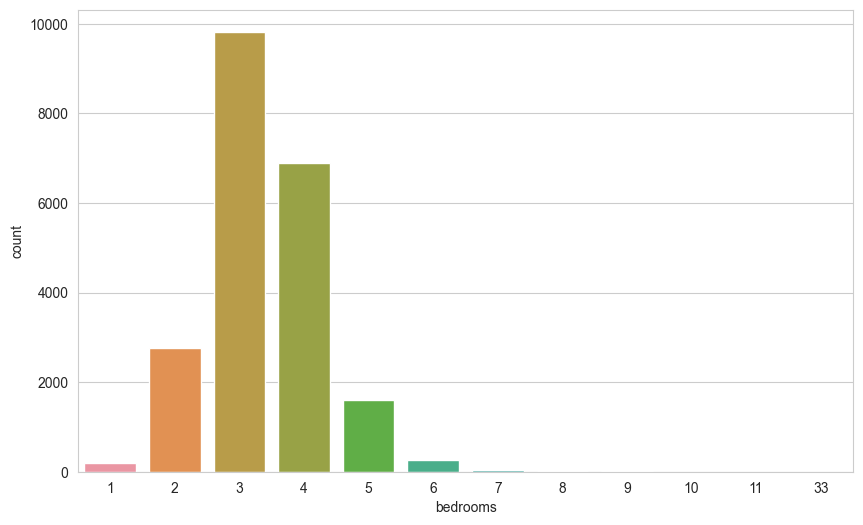

In [17]:
sns.countplot(x = df['bedrooms'])
plt.show()

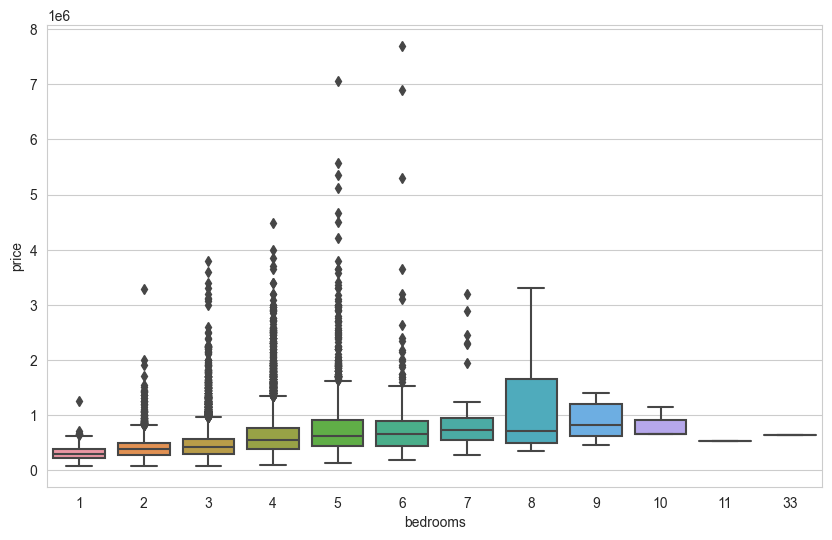

In [18]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [19]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [20]:
# drop the house with 33 bedrooms, Most likely the data was entered incorrectly.
df = df[df["bedrooms"] != 33]

In [21]:
df.shape

(21596, 20)

### date

In [22]:
# convert the data type of date feature to datetime
df['date'].dtype

dtype('O')

In [23]:
df['date']

0        10/13/2014
1         12/9/2014
2         2/25/2015
3         12/9/2014
4         2/18/2015
            ...    
21592     5/21/2014
21593     2/23/2015
21594     6/23/2014
21595     1/16/2015
21596    10/15/2014
Name: date, Length: 21596, dtype: object

In [24]:
df['date'] = pd.to_datetime(df['date'])

In [25]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [26]:
df['year'] = df['date'].dt.year
#df['year'] = df['date'].apply(lambda date : date.year)

In [27]:
df['month'] = df['date'].dt.month
# yıllara ve aylara gore model birseyler ogrenebilir mi diyerek yil ve ay featurelari ekliyoruz
# belliaylarda evler daha cok ve daha iyi fiyata satiliyor olabilir

In [28]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


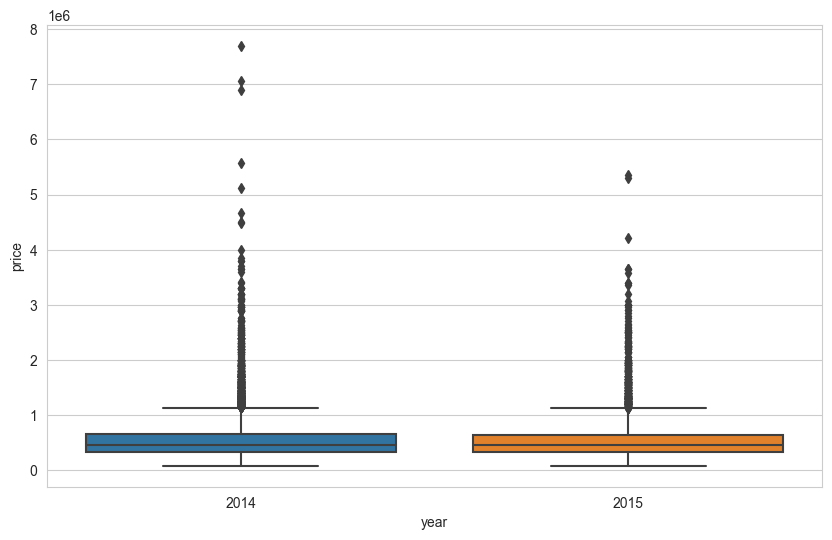

In [29]:
sns.boxplot(x = 'year', y = 'price', data = df);
# ne year ne month price acisindan cok fark olustu

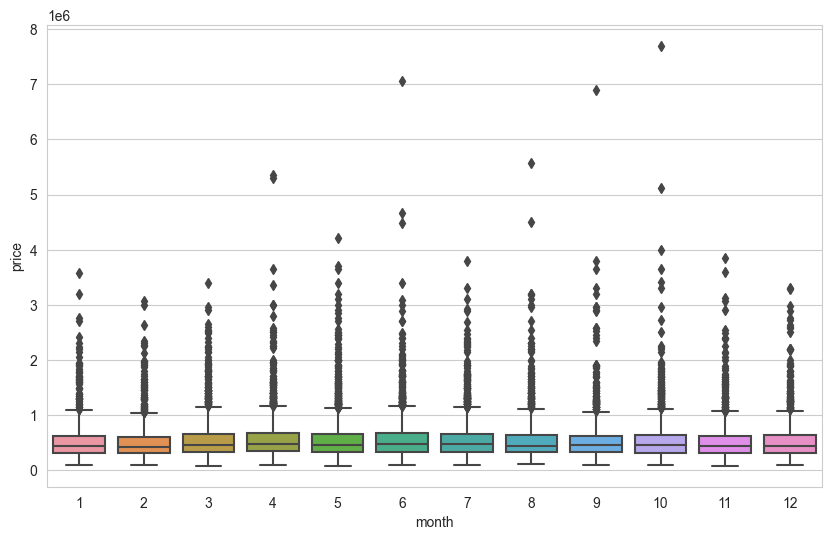

In [30]:
sns.boxplot(x = 'month', y = 'price', data = df);

In [31]:
df = df.drop(['date', "year", "month"], axis = 1)
# min. features max score mantığından hareketle date , year ve month featurelarını drop ediyoruz ;
# çünkü hem yıllara göre hem de aylara göre baktığımızda bariz ön plana çıkan bir durum yok .

### zipcode

In [32]:
df['zipcode'].value_counts(dropna = False)
# lat long oldugu icin dusuyoruz, yoksa düsmemeli

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be time consuming and can be made manually and requires domain knowledge to do that. So we will drop this column.

If you want to keep zipcodes, look into [hash encoding](https://medium.com/flutter-community/dealing-with-categorical-features-with-high-cardinality-feature-hashing-7c406ff867cb).

In [33]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [34]:
df['yr_renovated'].value_counts(dropna = False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

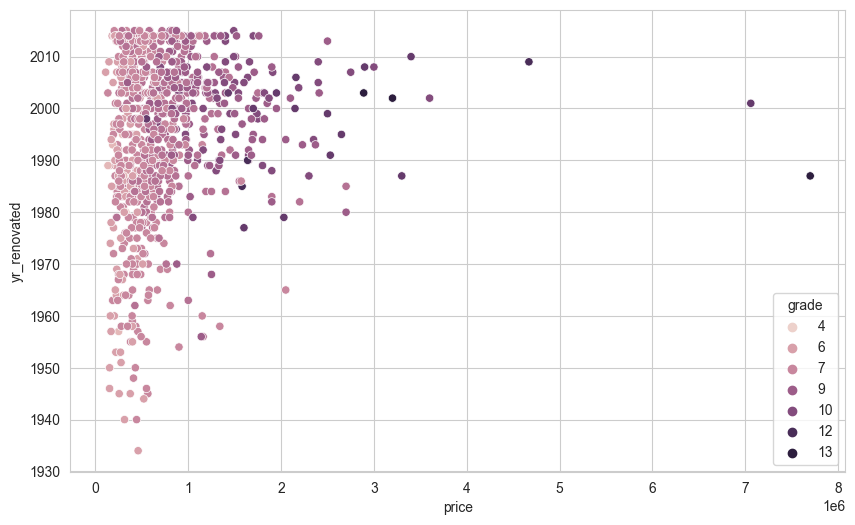

In [35]:
sns.scatterplot(x = 'price',y = 'yr_renovated', data = df[df.yr_renovated!=0], hue = "grade");

In [36]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

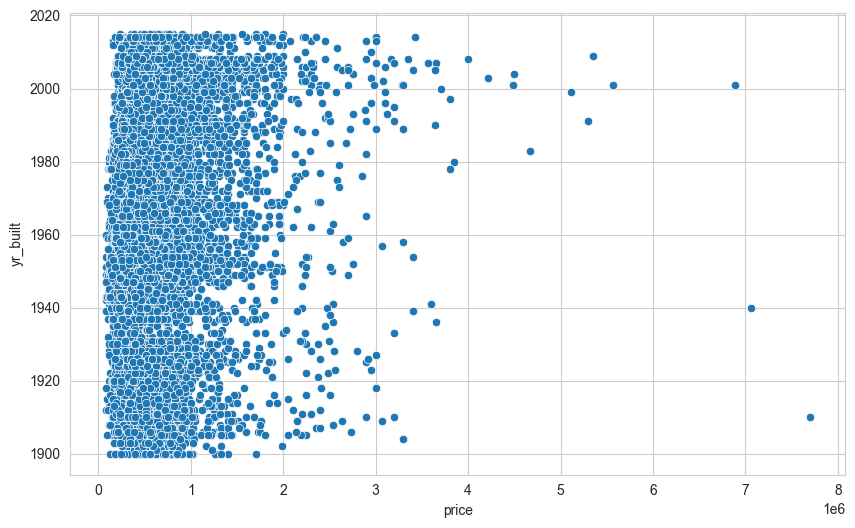

In [37]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df);

In [38]:
df.yr_renovated.apply(lambda x : x if x == 0 else 1).value_counts()

0    20682
1      914
Name: yr_renovated, dtype: int64

In [39]:
df["renovated"] = df.yr_renovated.apply(lambda x : x if x == 0 else 1)
## renovasyona uğrayan evler 1 uğramayanlar 0 olacak şekilde df'imize yeni bir feature ekliyoruz.

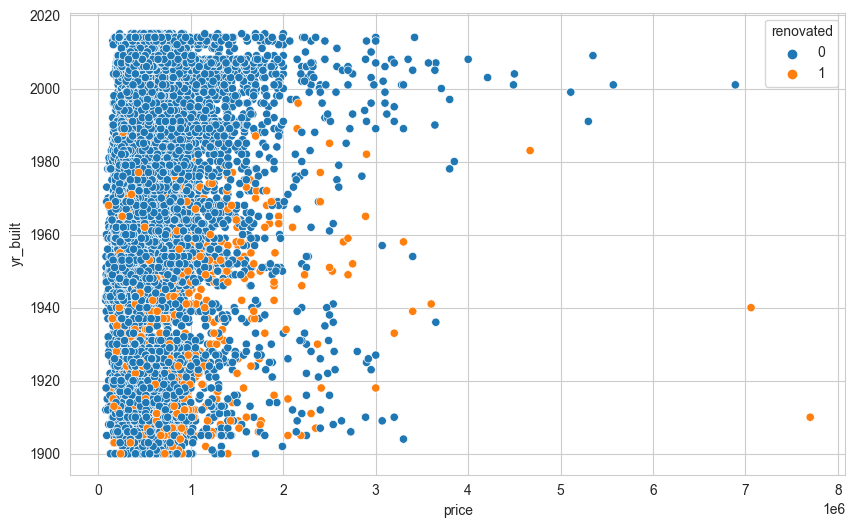

In [40]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df, hue = "renovated")
plt.show()

In [41]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]
# yeni bir feature daha ekliyoruz df'imize renovasyonun adam akıllı bir renovasyon olduğu kabulüyle ;
# renovasyona uğramış evler sanki o tarihte inşa edilmiş gibi davranıp bir feature engineering yapıyoruz.

0       1955.000
1       1991.000
2       1933.000
3       1965.000
4       1987.000
          ...   
21592   2009.000
21593   2014.000
21594   2009.000
21595   2004.000
21596   2008.000
Name: built|renovated, Length: 21596, dtype: float64

In [42]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,renovated,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,1,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1987.000


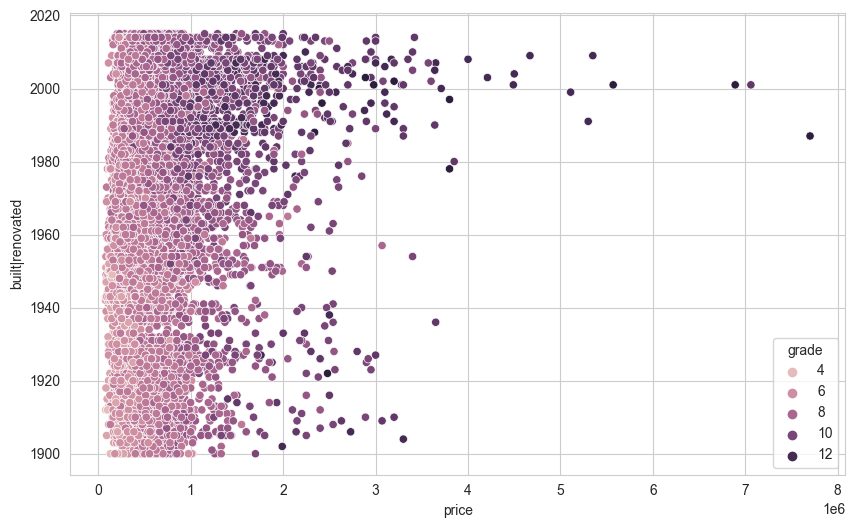

In [43]:
sns.scatterplot(x = 'price',y = 'built|renovated', data = df, hue = "grade");

In [44]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis = 1, inplace = True)
# elimizde "artik built|renovated" feature olduğundan diğerlerini drop ediyoruz .

### sqft_basement

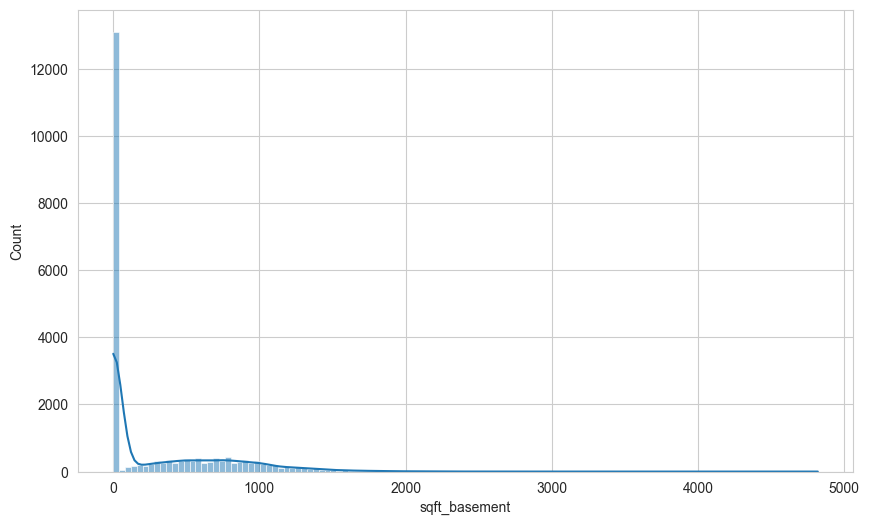

In [45]:
sns.histplot(df["sqft_basement"], kde=True)
plt.show()

In [46]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)
# 3000'den daha büyük bodruma sahip olan evler outlier gibi durduğundan onlara bakıyoruz ama ; 
# sqft_living = sqft_above + sqft_basement şartını hepsi sağladığından bunları düşmüyoruz.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


### sqft_above

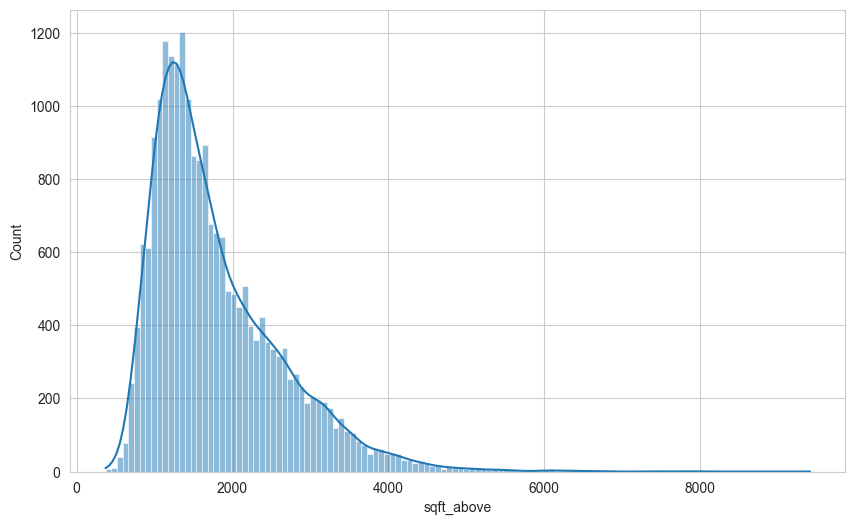

In [47]:
sns.histplot(df["sqft_above"], kde=True)
plt.show()

In [48]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

# 6000'den daha büyük sqft_above'ı olan evler outlier gibi durduğundan onlara bakıyoruz ama ; 
# sqft_living = sqft_above + sqft_basement şartını hepsi sağladığından bunları düşmüyoruz.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

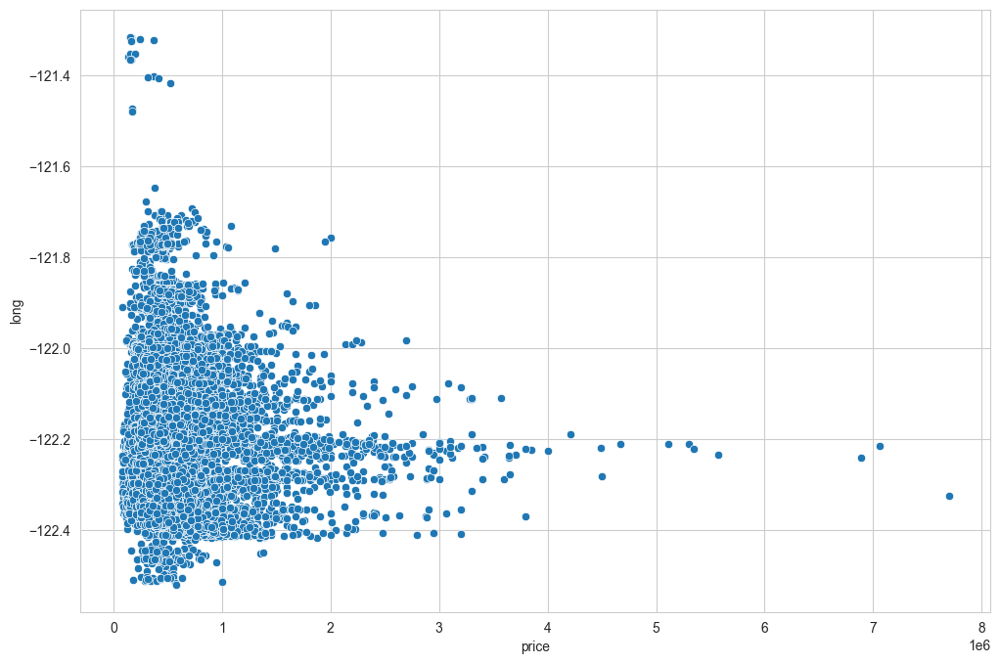

In [49]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

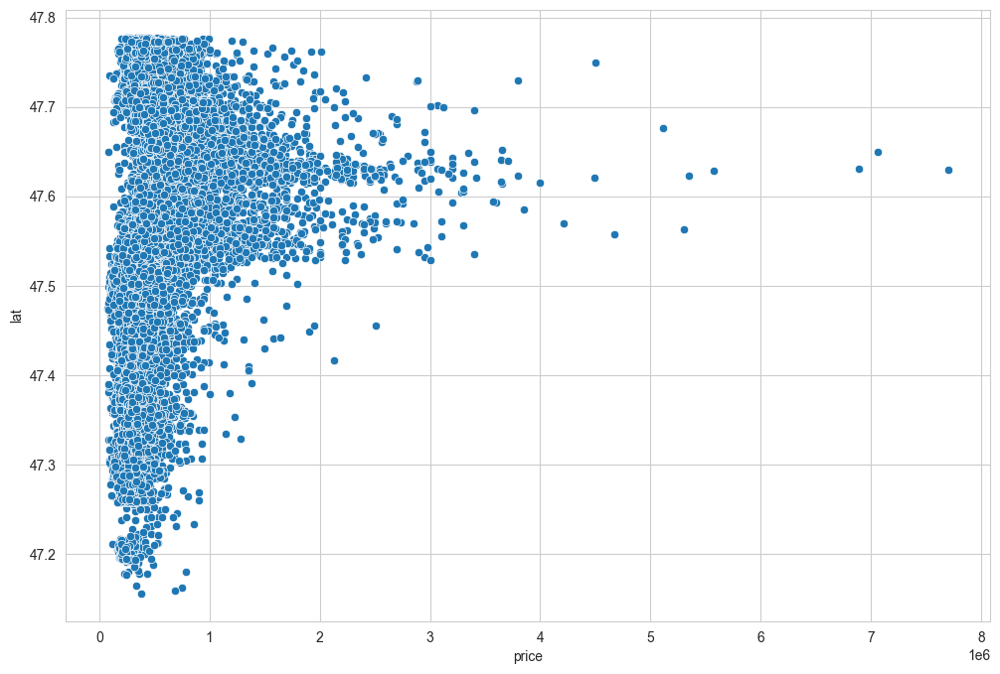

In [50]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

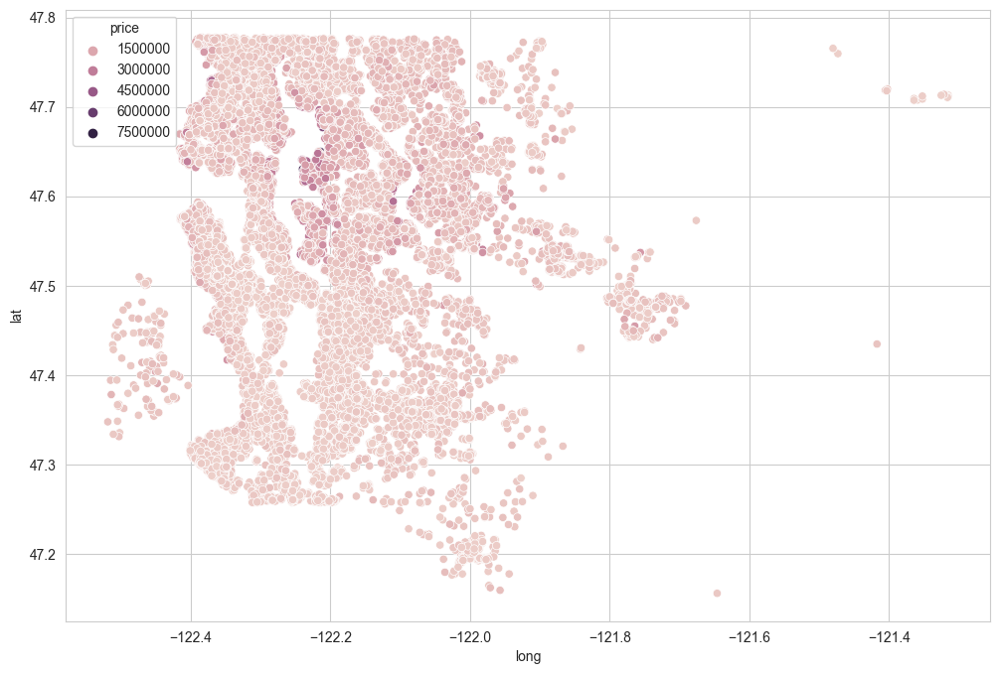

In [51]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price')
plt.show()
## long ve lat featurelarını scatter plotta gösterip renklendirmelerini de price'a göre yapmak için hue = 'price' yapıyoruz.
# long ve lat değerleri elimizde olduğundan haritayı andıran bir görüntüyle karşılaşıyoruz.

In [ ]:
# renklendirmeyi price'a göre yaptığımızdan yüksek fiyatlı evler koyu renkleri aldığından ve elimizde yüksek fiyata satılan ev
# sayısı az olduğundan bunlar olmadan bir görselleştirme yapsak nasıl olur diye düşünüyoruz :

In [52]:
len(df) * (0.01)
# datamızın %1'i 216 satıra tekabül ediyor .

215.96

In [53]:
df.sort_values('price', ascending = False).head(216)
# most expensive 216 houses

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,47.620,-122.212,2370,13320,1951.000


In [54]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]
## burada da en pahalı 216 hariç diğer bütün evleri non_top_1_perc adında bir değişkene atıyorum.renklendirme yaptığımızda 
# daha anlaşılır insgiht'lar elde etmek için.

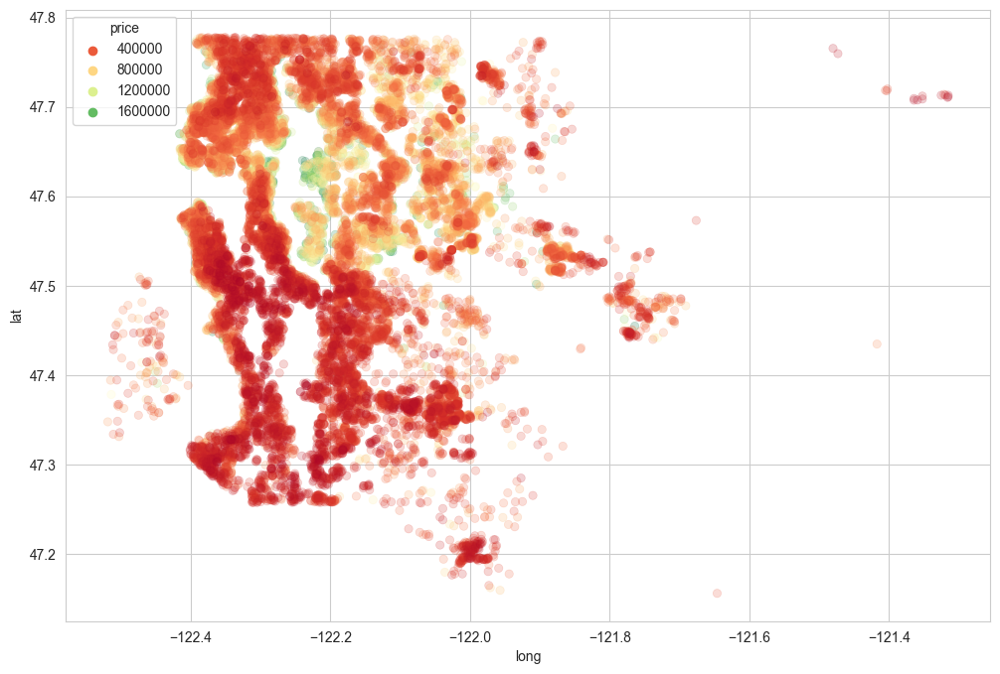

In [55]:
# enlem ve boylam bilgileri oldugunda scatter plot map gibi olur
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

In [56]:
# ama bunlari folium libray ile haritada gostermek daha efektif
# daha da düzgün insightlar çıkarabilmek için folium kütüphanesini kullanalim : 

# folium kütüphanesi ; veri görselleştirme için kullanılan bir harita oluşturma kütüphanesidir .
# folium, verilerin coğrafi konumunu görselleştirmek için kullanılır. 
import folium
import branca.colormap as cm # price ile colorlama icin

# branca.colormap modülü, Python'da renk haritaları (color map) oluşturmak için kullanılan bir kütüphanedir.
# Burada price'lara göre bir renklendirme yapacağımız için onu da import ediyoruz .

In [57]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

# folium.Map içerisine vereceğimiz location'a göre dünya üzerindeki her yerin haritasını getirebilir. 
# bizim elimizde lat ve long faetureları olduğundan bunların mean'lerini kullanarak haritanın defeault olarak nereden 
#başlayacağını belirtiyoruz ; zoom_start:default zoom oranıdır ama kodu çalıştırınca istediğimiz gibi harita üzerinde gezip,
# zoom vs de yapabiliriz .

In [58]:
# evleri pricea gore araliklara bolelim
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()
## çeşitli stepler belirliyorum ki price min'den max'a doğru olacak şekilde ; renklendirmeyi güzel 
# bir şekilde yapabileyim .

In [59]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
# haritamızı m adlı bir değişkene atıyoruz .
colormap = cm.StepColormap(
                        colors=["red","orange","yellow","green"] ,
                        index=[step_1, step_2, step_3, step_4, step_5],
                        vmin=step_1,
                        vmax=step_5)

# en düşük price red en yüksek price green olacak şekilde steplerimi belirliyorum  ve colormap adlı değişkene atıyorum.

for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1,
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m

# for döngüsündeki içerideki zip'le location'ı zipliyorum (lat,long) dışarıdaki zip'le de location'lara karşılık gelen 
# price'ları zipliyoum ((lat,log),price) ardından for döngüsüyle tuple unpacking yapıyorum loc = (lat,long) p = price 
# olacak şekilde her location ve price göre yukarıda tanımladığım renklendirmeyi haritama .add_to(m) ile ekliyorum.

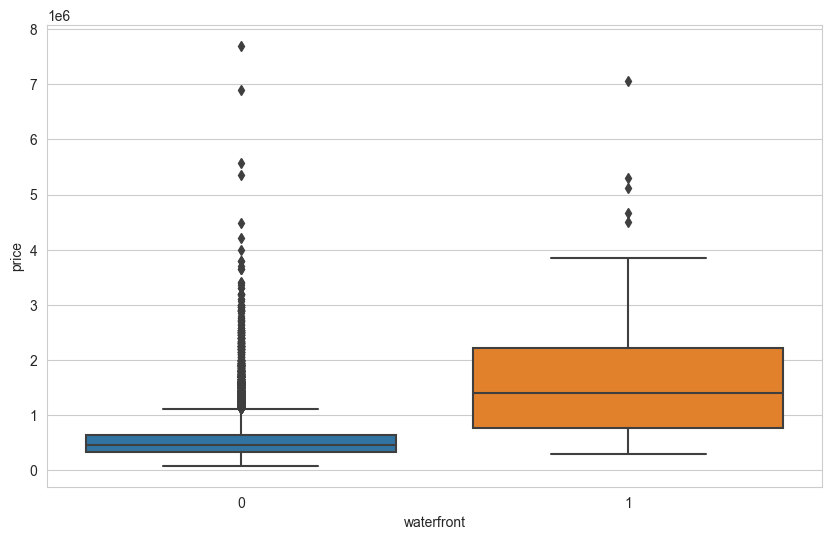

In [60]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [61]:
df.groupby("waterfront").price.mean()
# haritadan da waterfront'u olan evlerin daha pahalı olduğunu görmüştük burada da teyit etmiş olduk .

waterfront
0    531757.274
1   1662524.184
Name: price, dtype: float64

### latest data

In [62]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [63]:
df.shape

(21596, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [64]:
from sklearn.model_selection import train_test_split

In [65]:
X = df.drop('price', axis = 1)
y = df['price']

In [66]:
seed = 101

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [68]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

In [69]:
scaler = MinMaxScaler()
## ann arka planda gradient descent çalıştırdığı için scaler'a ihtiyaç duyar.

Scaling the data is often recommended when using the gradient descent optimization algorithm for several reasons:

- Faster convergence: Scaling the data can help the gradient descent algorithm converge faster. When features have different scales, the gradients for each feature can vary widely. This can cause the optimization process to take longer as it needs more iterations to find the optimal solution. By scaling the data, the gradients are normalized, allowing the algorithm to take more consistent steps towards the minimum of the cost function.
- Avoiding numerical instability: Large differences in feature scales can lead to numerical instability during the optimization process. The calculations involved in gradient descent, such as multiplying weights with feature values, can result in large intermediate values or floating-point precision issues. Scaling the data helps mitigate this problem by bringing all the features to a similar scale, reducing the chance of numerical instability.
- Balanced influence of features: When features have different scales, the ones with larger scales can dominate the optimization process. This can cause the algorithm to neglect the contributions of features with smaller scales. By scaling the data, each feature has a similar influence on the optimization process, ensuring a balanced consideration of all features.
- Regularization effects: Scaling the data can also have implications for regularization techniques like L1 and L2 regularization. Scaling the data ensures that the regularization terms have similar effects on all features, preventing biases towards features with larger scales.

It's worth noting that not all machine learning algorithms require data scaling. Some algorithms, like decision trees or random forests, are not sensitive to feature scales. However, gradient descent-based algorithms, such as linear regression or neural networks, often benefit from data scaling to improve convergence and performance.

In [70]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [71]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense,Activation # Activation'ı bir layer olarak "da" kullanabiliriz 
                                                           # o yüzden burada onu da import edelim.

2023-05-13 09:59:51.395577: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [72]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [73]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = mean_squared_error(actual, pred,squared=False)
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [74]:
X_train.shape

(19436, 16)

In [75]:
tf.keras.utils.set_random_seed(seed) 
# biz normalde modelin mimarisini her kurduğumuzda random olarak ağırlıkları ve bias'leri atıyor ama biz şimdi 
# learning rate , dropout , earlystopping gibi kavramlar göreceğiz onların farklarını görebilmek için 
# tf.keras.utils.set_random_seed(seed)  ile model her çalıştığında aynı ağırlıkları atasın istiyorum.

model = Sequential()

# genel egilim, ilk hidden layerda feature sayisinin (16) 1.5 katini alip daha sonraki layerlearda kademeli
# azaltmadir. Ama bu kesin degildir. Benzer datalarla yapilmis akademik calisamlarda neler kullanilmis
# skorlari iyilestirmek icin neuron sayisi nasil baslatilip azaltilmis, onlardann faydalanmak lazim
# tamamen deneme yanilma ile bulacagiz.
# ne kadar cok layer ve neoron o kadar cok computational cost ayrica
model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
# her bir neuronun gem giris hem cikislari tum noranlara bagli olsun diye dense kullaniyoruz, fully connected olsu diye
#model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer.  
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer="adam", loss="mse")
# adam'in default degerlerini aliyor learning rate icin vs

# neden adam ve relu:
# wieghts guncellensin diye relu da alabilirdik; tanh denedeigimizde reluya gore daha kotu skorlar aldik
# optimizer icin de en iyi sonucu adam ile aldigimiz icin adam sectik

# problemimiz regresyon problemi olduğundan loss = "mse" yapıyoruz . optimizer hyperparametresi ağırlıkları güncellerken
# hangi gradient descent türünü kullanmak istediğimizle alakalıdır 'rmsprop' gibi "adam" gibi optimizer çeşitlerini deneyerek
# en iyi sonucu hangisi veriyorsa yola onunla devam etmemiz gerekir burada optimizer türü datadan dataya göre farklılık gösterir

2023-05-13 10:00:12.706090: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [76]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 24)                408       
                                                                 
 dense_1 (Dense)             (None, 24)                600       
                                                                 
 dense_2 (Dense)             (None, 12)                300       
                                                                 
 dense_3 (Dense)             (None, 6)                 78        
                                                                 
 dense_4 (Dense)             (None, 1)                 7         
                                                                 
Total params: 1,393
Trainable params: 1,393
Non-trainable params: 0
_________________________________________________________________


In [77]:
model.weights
# random state ile seed belirleigimiz icin weights random olmadi ve tekrar clistirinca degismedi

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.35647073,  0.38490498, -0.08744469,  0.15377373,  0.22215843,
         -0.02771163,  0.11982757, -0.35179138, -0.22738509, -0.01394773,
          0.37500745,  0.17092556, -0.33209184,  0.32572126,  0.04000178,
          0.28462964, -0.04399332,  0.19303006,  0.24007684, -0.07156605,
         -0.07338411, -0.26527756, -0.10138947, -0.12765884],
        [ 0.20285243,  0.1625874 ,  0.09493753,  0.210621  , -0.3477749 ,
          0.04268652,  0.24083078, -0.3537471 , -0.37514928,  0.31485617,
         -0.10756519,  0.02557248,  0.0060361 ,  0.10938206, -0.04046023,
          0.38605756,  0.05352944,  0.2004916 ,  0.16421968, -0.09854421,
          0.27363658,  0.14958262, -0.26525187, -0.17038073],
        [-0.14781646,  0.22237402, -0.25978014, -0.08758965, -0.01525185,
         -0.27800336,  0.36590946, -0.04418713,  0.21475899, -0.20625347,
         -0.21336366, -0.06695104, -0.19746223, -0.03350914,  0.2787

In [78]:
X_train.shape

(19436, 16)

In [79]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)
# error metric karsilastirmasini train ve val uzerinden yapacagiz

# epoch 1000: train datasini 1000 cycle ile gor
# batch size 128: train datasini kacli gruplar halinde modele verecegiz
# 1393 parametre var, model fit edilirken her bir epochta 130 guncelleme olacak ve 130000 kere agirliklar
# guncellenecek

# validation_split, eğitim verilerinin bir kısmını validation setine ayırmak için kullanılır.burada 0.15 belirttiğimizden ;
# train setinin SONDAN %15 validation olarak ayrılır.
# Validation seti, modelin eğitim sırasında performansını değerlendirmek için kullanılır.
# Validation seti  üzerinde modelin performansı izlenir eğitimde ve eğitim verileri üzerindeki performansla karşılaştırılır.
# Bu sayede, model ---> overfitting mi olmuş underfitting mi olmuş bu sayede gözlemlenir.

Epoch 1/1000
130/130 [==============================] - 3s 8ms/step - loss: 428607209472.0000 - val_loss: 423966932992.0000
Epoch 2/1000
130/130 [==============================] - 1s 6ms/step - loss: 427920916480.0000 - val_loss: 421725831168.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 419527622656.0000 - val_loss: 403137527808.0000
Epoch 4/1000
130/130 [==============================] - 1s 4ms/step - loss: 379123204096.0000 - val_loss: 335301672960.0000
Epoch 5/1000
130/130 [==============================] - 1s 4ms/step - loss: 275292192768.0000 - val_loss: 204272713728.0000
Epoch 6/1000
130/130 [==============================] - 1s 7ms/step - loss: 147549601792.0000 - val_loss: 111843483648.0000
Epoch 7/1000
130/130 [==============================] - 1s 8ms/step - loss: 97283997696.0000 - val_loss: 100163756032.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 92646817792.0000 - val_loss: 99083345920.0000
Epoch 9/100

In [80]:
# model.fit arka planda weightsi guncelledi backpropagatin ile, bu nednele weights artik farkli
model.weights

[<tf.Variable 'dense/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-5.07015646e-01,  2.26964504e-01,  5.59956729e-01,
          2.45032787e-01, -4.36779618e-01, -2.77116299e-02,
         -9.32378843e-02, -6.33088470e-01, -3.97953898e-01,
         -2.78791845e-01, -4.60787974e-02, -2.31044441e-01,
         -2.09623694e+00, -6.31700233e-02, -2.93359846e-01,
         -1.18666790e-01, -4.39933240e-02, -1.80183545e-01,
         -5.60750842e-01, -1.61154604e+00, -7.25102484e-01,
          1.27217925e+00, -3.06930691e-01, -1.74832582e-01],
        [ 9.81123805e-01,  8.49373102e-01,  3.54583681e-01,
          9.07259762e-01,  2.15093756e+00,  4.26865220e-02,
          9.59398091e-01,  3.46048772e-01,  4.37589169e-01,
          1.05915153e+00,  1.78224051e+00,  1.62033248e+00,
          1.48939490e+00,  5.68406463e-01,  5.85648894e-01,
          7.02861011e-01,  5.35294414e-02,  2.02752873e-01,
          2.07487369e+00,  2.23793721e+00,  2.21807647e+00,
          9.37457144e-01,  4.61

In [81]:
# loss ve val loss karsilastirarak underfitting overfitting kontrolu yapalim
pd.DataFrame(model.history.history)

,loss,val_loss
0,428607209472.000,423966932992.000
1,427920916480.000,421725831168.000
2,419527622656.000,403137527808.000
3,379123204096.000,335301672960.000
4,275292192768.000,204272713728.000
...,...,...
995,20056987648.000,23609950208.000
996,19985156096.000,24053850112.000
997,20020361216.000,23683067904.000
998,19953414144.000,23698264064.000


<AxesSubplot:>

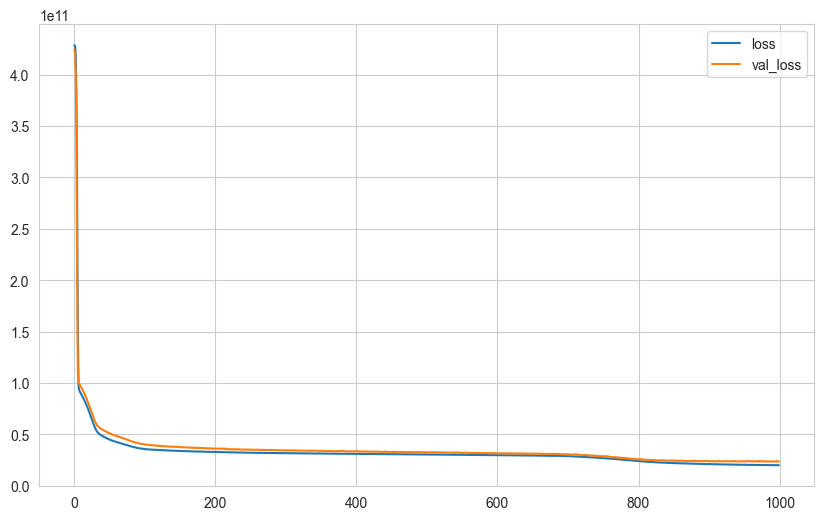

In [82]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()
# val_loss ve loss değerleri beraber aynı şekilde düşmüşler biz daha fazla modeli eğitebiliriz yani epoch sayısını artırabiliriz
# çünkü overfittig bir durum gözükmüyor.

In [83]:
model.evaluate(X_test, y_test, verbose=0)
# mse oldugu icin bu yaniltici olabilir

19023163392.0

In [84]:
y_pred = model.predict(X_test)
# test datasiyla skorlari karsilastiralim

68/68 [==============================] - 0s 3ms/step


In [85]:
eval_metric(y_test, y_pred)
# overfitting olmadigi icin burda epoch sayisini artirip tekrar da modelleyebiliriz aslinda

r2_score: 0.8519364866173137 
mae: 82042.80457175926 
mse: 19023164950.984844 
rmse: 137924.49003344128


### learning_rate

Epoch artirmak herine alternatif olarak learning rate'i yeniden ayarlayarak skorlari iyilestirmeye calisalim. Learning rate'i cok dusuk tutunca global minimuma ulasamamis olabilirz (emin olmayacagiz hic), adim buyuklugunu artirarak deneyelim bir de daha minimuma inmeyi ve daha iyi skorlar elde edebilmeyi.

epoch sayısını artırabiliriz  ama şimdi bir de learning rate 'in nasıl bir etkisi olacak onu görmek için 
diğer her şeyi sabit tutup learning rate ile oynayacağız :

In [86]:
from tensorflow.keras.optimizers import Adam

## -----> biz eğer bir optimizer'ın default learnig rate'ini değiştirmek istiyorsak tensorflow.keras.optimizers'dan
## ----------> hangi optimizerın learning rate'ini değiştireceksek önce onu import ediyoruz.

In [87]:
tf.keras.utils.set_random_seed(seed) 

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(learning_rate = 0.002) # default learning rate value is 0.001

# optimizer'ı compile'a string olarak verdiğimizde "adam" gibi ; bu default learning rate kullanacağım demektir bunu değiştirmek
# istiyorsak opt = Adam(lr = 0.002) bu şekilde tanımlayıp içerisine istediğimiz lr oranını yazıp ardından compile satırına
# bunu tanımlıyoruz :
model.compile(optimizer = opt, loss = 'mse')

In [88]:
model.weights

[<tf.Variable 'dense_5/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-0.35647073,  0.38490498, -0.08744469,  0.15377373,  0.22215843,
         -0.02771163,  0.11982757, -0.35179138, -0.22738509, -0.01394773,
          0.37500745,  0.17092556, -0.33209184,  0.32572126,  0.04000178,
          0.28462964, -0.04399332,  0.19303006,  0.24007684, -0.07156605,
         -0.07338411, -0.26527756, -0.10138947, -0.12765884],
        [ 0.20285243,  0.1625874 ,  0.09493753,  0.210621  , -0.3477749 ,
          0.04268652,  0.24083078, -0.3537471 , -0.37514928,  0.31485617,
         -0.10756519,  0.02557248,  0.0060361 ,  0.10938206, -0.04046023,
          0.38605756,  0.05352944,  0.2004916 ,  0.16421968, -0.09854421,
          0.27363658,  0.14958262, -0.26525187, -0.17038073],
        [-0.14781646,  0.22237402, -0.25978014, -0.08758965, -0.01525185,
         -0.27800336,  0.36590946, -0.04418713,  0.21475899, -0.20625347,
         -0.21336366, -0.06695104, -0.19746223, -0.03350914,  0.27

In [89]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 4s 10ms/step - loss: 428607209472.0000 - val_loss: 423966932992.0000
Epoch 2/1000
130/130 [==============================] - 1s 4ms/step - loss: 427920916480.0000 - val_loss: 421725831168.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 419527622656.0000 - val_loss: 403137527808.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 379123204096.0000 - val_loss: 335301672960.0000
Epoch 5/1000
130/130 [==============================] - 0s 4ms/step - loss: 275292192768.0000 - val_loss: 204272713728.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 147549601792.0000 - val_loss: 111843483648.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 97283997696.0000 - val_loss: 100163756032.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 92646817792.0000 - val_loss: 99083345920.0000
Epoch 9/10

<AxesSubplot:>

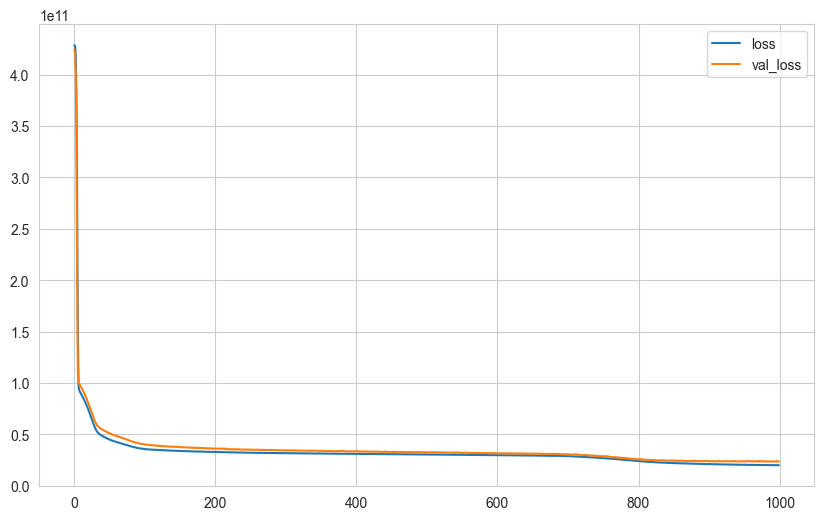

In [90]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [91]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [92]:
eval_metric(y_test, y_pred)

# r2 85ten 88e cikti. learning rate adimini artirdigimizda, step size artinca farkli bir local min noktaya igtti,
# bu yeni min nokta global mi local mi anlayamayacagiz hic bir zaman, ama skorlarin iyilesmesi
# min acisindan daha farkli bir local min noktasinna gittimgimizi gosteriyor.

# learning rate'i 2 katına çıkardığımızda Step_size (adım büyüklüğümüz arttından) ; başka bir lokal minuma girmiş 
# ve daha düşük loss değerlerine ulaştığını görebiliyorum . learning rate best_pratice şu olur diye bir şey diyemeyiz ; 
# datadan dataya değişir bir kaç değer deneyip optimum lr değerini kendimiz belirleyebiliriz datamız için.

r2_score: 0.8519364866173137 
mae: 82042.80457175926 
mse: 19023164950.984844 
rmse: 137924.49003344128


### EarlyStopping

MLdeki rehularization teknikleri olan L1 veya L2 yerine Dl'de daha geslimis teknikler var: early stopping veya dropout gibi. Bu datada overfitting olmamasina ragmen, sanki varmis gibi uygulanacak teknikleri deneyelim:

In [93]:
from tensorflow.keras.callbacks import EarlyStopping

# EarlyStopping bir regularization tekniğidir.

In [94]:
tf.keras.utils.set_random_seed(seed) 


model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.002) # 0.002 lr, bec gives better scores


model.compile(optimizer = opt, loss = 'mse')

In [95]:

early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)

# bir model eğitilirken EarlyStopping kullanmak istiyorsak onu bu şekilde tanımlayacağız : 

# "monitor" : Takip edilecek ölçütün adıdır.burada mesela val_loss kullandık ,
# biz val_loss'un minimum olmasını istediğimiz için mode = "min" yaptık .
# patience ise 25 epoch boyunca eğer val_loss düşmezse eğitimi durdurmasını söylüyoruz patience olarak da best pratice şu 
# olur diyebiliceğimiz bir durum yoktur . model eğer 25 epoch boyunca val_loss değerinde bir iyileşme görmezse eğitimi keser.
# restore_best_weights = True ise modelin eğitimi kestiği yerdeki değil de 25 epoch önceki ağırlıklar ile modeli kurmasını
# istediğimizi söylüyoruz default'u False'tur ve öyle bırakırsak eğitimi kestiği yerdeki ağırlıklar ile model eğitilmiş olur .

In [96]:
# callbacklerden import etmistik. liste icinde yazilir early stop variable'i, list icinde olmazsa hata
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

# 976da kesmis; ama 951 en dusugu; 951den sonraki 25 hep artmis,bu nedenle restore_best_weights ile 951i kullandi

Epoch 1/1000
130/130 [==============================] - 2s 4ms/step - loss: 428607209472.0000 - val_loss: 423966932992.0000
Epoch 2/1000
130/130 [==============================] - 1s 5ms/step - loss: 427920916480.0000 - val_loss: 421725831168.0000
Epoch 3/1000
130/130 [==============================] - 0s 4ms/step - loss: 419527622656.0000 - val_loss: 403137527808.0000
Epoch 4/1000
130/130 [==============================] - 1s 5ms/step - loss: 379123204096.0000 - val_loss: 335301672960.0000
Epoch 5/1000
130/130 [==============================] - 1s 5ms/step - loss: 275292192768.0000 - val_loss: 204272713728.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 147549601792.0000 - val_loss: 111843483648.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 97283997696.0000 - val_loss: 100163756032.0000
Epoch 8/1000
130/130 [==============================] - 0s 4ms/step - loss: 92646817792.0000 - val_loss: 99083345920.0000
Epoch 9/100

<AxesSubplot:>

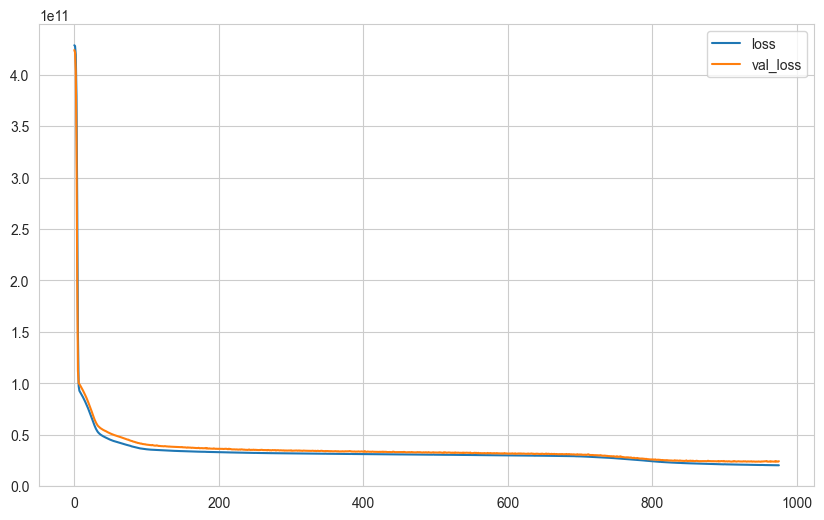

In [97]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [98]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [99]:
eval_metric(y_test, y_pred)

# 87ye dustu. zaten datada overfitting yoktu; overfitting olmayan datada hata ekleyerek r2yi düsürdü

r2_score: 0.8513424230593438 
mae: 82040.95390625 
mse: 19099490095.488346 
rmse: 138200.90482876133


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

dropoyt her iterasyonda (her batchde degil) weights guncellenirken bazi noronlari dikkate almayacak, bazı noronlara hic bilgi aktarilmamasini saglayacak. yani 130 iterasyon yaparken tamamen random olarak iterasyonlarin yarisinda belli noronlara, diger yarisinda baska noronlara calisacak.

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [100]:
from tensorflow.keras.layers import Dropout

# ---> Dropout'ta bir regularization tekniğidir.
# Dropout, ağın belirli bir kısmını her İTERASYONDA rastgele seçerek "eğitim" sırasında devre dışı bırakır.Yukarıda şekilde 
# görüleceği gibi. biz modelimizin datayı ezberlemesini engellemek isteriz datadaki kuralları öğrenmesini datanın yapısını 
# anlamasını isteriz ama model datayı takıntı haline getirirse yani ezberlerse bu dropout yöntemi de kullanabileceğimiz bir 
# regularization tekniğidir.


# Dropout'u bir layer gibi modelimize ekleyeceğiz aşağıdaki örnekte olduğu gibi. 
# model.add(Dropout(0.2)) demek her iterasyonda nöronların MAX  %20 'si kapanacak demektir ve bu her iterasyonda RASTGELE olur

In [101]:
tf.keras.utils.set_random_seed(seed) 

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
 
model.add(Dense(24, activation = 'relu'))
model.add(Dropout(0.2)) # max yuzde 20ye varacak sekilde noronlari kapatacak
# her layerda kullanmak zorunda degiliz, istedigimiz yerde kullaniriz, best practicei yok, tamamen deneme yanilmaz
model.add(Dense(12, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(6, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.002)
model.compile(optimizer = opt, loss = 'mse')

In [102]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)

In [103]:
# 240ta kesti
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 2s 4ms/step - loss: 428607504384.0000 - val_loss: 423968440320.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 427775426560.0000 - val_loss: 421120901120.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 416450150400.0000 - val_loss: 395241619456.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 357910511616.0000 - val_loss: 295573684224.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 225692844032.0000 - val_loss: 148579352576.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 136629035008.0000 - val_loss: 105084829696.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 126341021696.0000 - val_loss: 101563121664.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 128603029504.0000 - val_loss: 100537360384.0000
Epoch 9/

<AxesSubplot:>

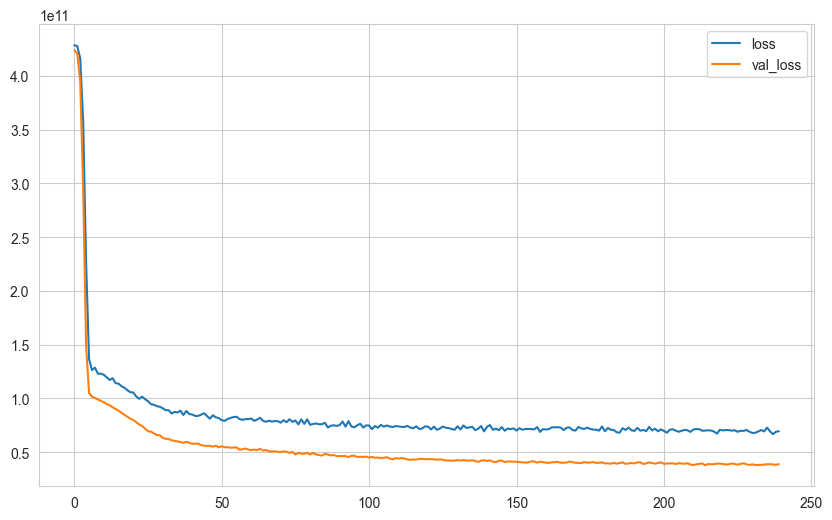

In [104]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()
# bu bir overfitting teknigi; bu mudahalemiz trainde valdan daha az hata olmasina, yani modein train asmaasinda tam ogrenemedigi 
# ve underfitting oldugunu gosteriyor. datada overfitting yoktu zaten, biz bias ekleyerek underfitting yaptik

In [105]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [106]:
eval_metric(y_test, y_pred)

r2_score: 0.7525806411756851 
mae: 109165.99867078994 
mse: 31788380320.389076 
rmse: 178292.96206073047


## Saving Final Model and Scaler

In [107]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))
# scaler'ımızı pickle ile dump ediyoruz.

In [108]:
tf.keras.utils.set_random_seed(seed) 

# dropotu cikarip learning ratei tutarak final model kuralim
model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.002)


model.compile(optimizer = opt, loss = 'mse')

In [109]:
# 100 epoch boyunca patience
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 100, restore_best_weights = True)

In [110]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1500,
         callbacks = [early_stop]
         )
# final model oldugu icin validation dataya test datayi verdik
# early stop calismadi, cunku patience degeri 100; 25 yapsak bir yerde duru

# burada validation datası olarak test datasını kullandık bu artık final model . train datası olarak da daha fazla datayla
# modeli eğitiyoruz . early_stopdaki patience'ı = 100 olduğuna dikkat edelim ve burada epoch sayımı 1500 yapıyorum yani model
# daha fazla eğitilecek.

Epoch 1/1500
152/152 [==============================] - 2s 4ms/step - loss: 427906334720.0000 - val_loss: 417248444416.0000
Epoch 2/1500
152/152 [==============================] - 0s 2ms/step - loss: 426216554496.0000 - val_loss: 411799224320.0000
Epoch 3/1500
152/152 [==============================] - 0s 2ms/step - loss: 406648291328.0000 - val_loss: 369849073664.0000
Epoch 4/1500
152/152 [==============================] - 0s 2ms/step - loss: 324312367104.0000 - val_loss: 244184842240.0000
Epoch 5/1500
152/152 [==============================] - 0s 2ms/step - loss: 178814631936.0000 - val_loss: 111362662400.0000
Epoch 6/1500
152/152 [==============================] - 0s 3ms/step - loss: 101552889856.0000 - val_loss: 88081997824.0000
Epoch 7/1500
152/152 [==============================] - 0s 3ms/step - loss: 93692715008.0000 - val_loss: 86473515008.0000
Epoch 8/1500
152/152 [==============================] - 0s 3ms/step - loss: 92242165760.0000 - val_loss: 85143584768.0000
Epoch 9/1500


<AxesSubplot:>

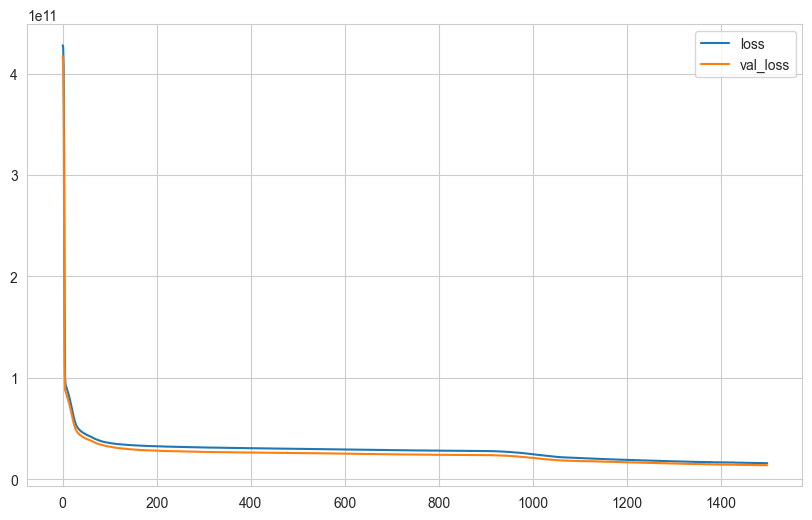

In [111]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()
# overfitting yok

In [112]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [113]:
eval_metric(y_test, y_pred)

## skorlarımız arttı bunun nedeni daha fazla datayla eğitim yapması olabilceği gibi biz ne yaptık bu sefer 1500 epoch ile modeli
# eğittik early_stop da 100 patience olduğundan devreye girmedi hemen yukarıdaki grafiğimize bakarsak overifitting de yok bizim
# için şu anda iyi bir durum.

r2_score: 0.8916515634022619 
mae: 73730.76174045139 
mse: 13920581340.339254 
rmse: 117985.5132647193


In [114]:
# Mlde pickle kullailiyordu; DL'de modal.save() ile kaydederiz
# h5 uzantili da olabilir uzantisiz da, cok far yok, ama best prac .h5
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'

# weights, bias, model architecture vs hersey bu saved model icinde. transfer learninge imkan taniyor bu.
# ornegin multiclass icin output layer bunda 5 yapilmis ama biz tek class calisiyorsak 1 diye guncelleyebilecegiz



# deep learning'te modeli kaydederken pickle ile kaydedemiyoruz kendine has bir kaydetme methodu var o da model.save şeklinde
# istersek h5 uzantılı olarak kaydederiz istersek uzantısız kaydederiz modeli kaydettiğimizde modelin ağırlıkları , mimamirisi,
# compile satırı da kaydedilmiş olur bu da aslında transfer learninge imkan tanıyan bir husus.

## Loading Model and Scaler

In [115]:
from tensorflow.keras.models import load_model

# model.save ile kaydettiğimi bir model load_model ile tekrar kullanmak üzere çağırabiliriz.

In [116]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [117]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [118]:
single_house = scaler_kc_house.transform(single_house)
single_house

## modeli nasıl eğittiysek tahmin alırken de o şekle getirmeliyiz.scaler yapıyoruz bundan dolayı

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00573322,
        0.47826087]])

In [119]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 178ms/step


array([[259095.53]], dtype=float32)

In [120]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [121]:
from sklearn.linear_model import LinearRegression 

In [122]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7054431219005433 
mae: 124715.1481019047 
mse: 37844597575.166885 
rmse: 194536.87973021177


### Random Forest

In [123]:
from sklearn.ensemble import RandomForestRegressor

In [124]:
# vinallia model dahi cok iyi skor verdi. cunku bu data kucuk bir data; DL buyuk data ister
# DL fazla datada ve unstructured, image gibi datalarda daha iyi
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

# traditional ml algoritmaları data miktarımız 20K civarında olduğu için dl algoritmalarına göre performansı iyi çıkabilir.
# mesela rf'da herhangi bir optimizasyon yapmamamıza rağmen skorlar gayet iyi .

r2_score: 0.8912532816836695 
mae: 64653.2709236993 
mse: 13971752480.727938 
rmse: 118202.16783429963
